In [3]:
import cv2, os
from PIL import Image
import numpy as np
from matplotlib import pyplot as plt
import pytesseract
from pytesseract import Output
import re
import os 
from IPython.display import Image, display


In [ ]:
vidcap = cv2.VideoCapture("clip.mov") #this is a 30 second video that was a screen recording of a livestream; i'm not sure why its 400MB  

In [ ]:
os.makedirs("frames", exist_ok=True) #where we store all the frames of the video (this was 320 MB and 61 frames) 
frame_rate = 2
count = 0
while True:
    success, image = vidcap.read()
    if not success: break
    if int(vidcap.get(1)) % int(vidcap.get(5)//frame_rate) == 0:
        cv2.imwrite(f"frames/frame{count:04d}.png", image)
        count += 1

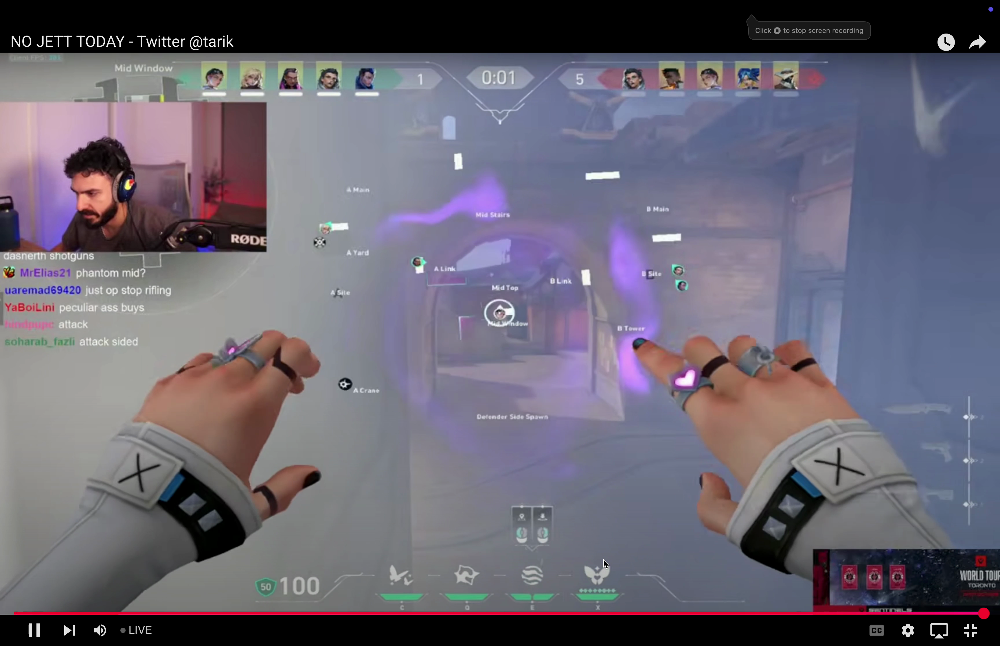

In [ ]:
display(Image(filename="frames/frame0000.png")) 

In [ ]:
img = Image.open("frames/frame0000.png")
'''
doesn't display in the notebook but this is where i figured out where to crop the image to only show the chat; it actually should be easier 
for Speed's livestreams because his livechat puts username and text comment in different columns
'''
chat_crop = img.crop((0, 800, 700, 1300))
chat_crop.show()

In [10]:
data = pytesseract.image_to_data(chat_crop, output_type=Output.DICT)

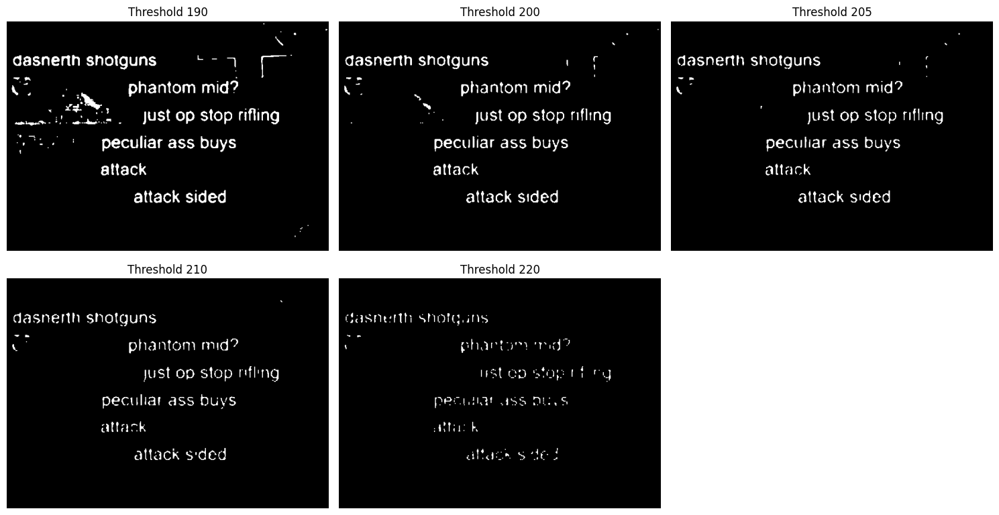

In [ ]:
img = cv2.imread("frames/frame0000.png") ## test inital img.
chat_crop = img[800:1300, 0:700]  # (top:bottom, left:right)
gray = cv2.cvtColor(chat_crop, cv2.COLOR_BGR2GRAY)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
enhanced = clahe.apply(gray)
# pytesseract prefers black text on white but i was just checking because the rule for ignoring usernames was based on color (but i think for the actual speed videos can be just location based)
threshold_values = [190, 200, 205, 210, 220]
plt.figure(figsize=(15, 8))
for i, thresh_val in enumerate(threshold_values):
    _, thresh = cv2.threshold(enhanced, thresh_val, 255, cv2.THRESH_BINARY)
    kernel = np.ones((2, 2), np.uint8)
    cleaned = cv2.morphologyEx(thresh, cv2.MORPH_OPEN, kernel)
    plt.subplot(2, 3, i+1)
    plt.imshow(cleaned, cmap='gray')
    plt.title(f"threshold {thresh_val}")
    plt.axis('off')
plt.tight_layout()
plt.show()


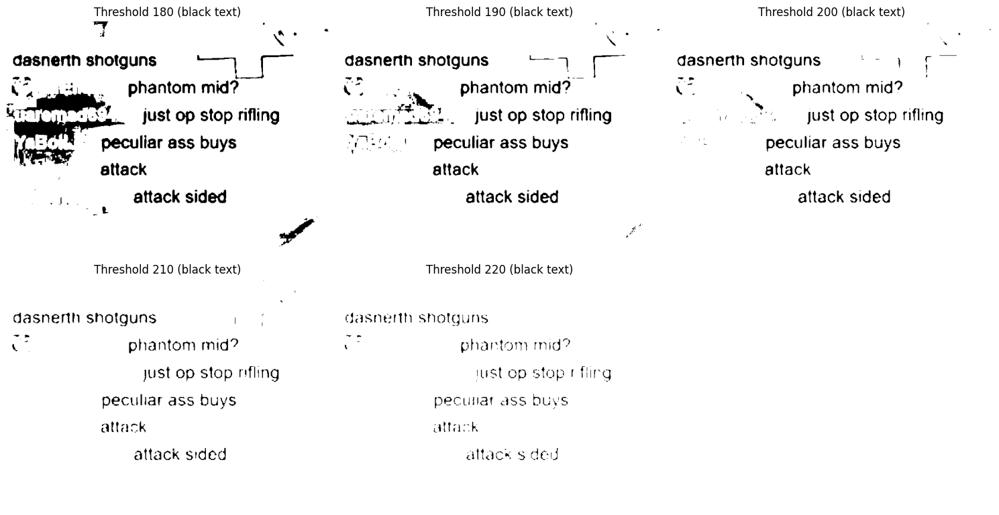

In [ ]:
# black text on white 
img = cv2.imread("frames/frame0000.png")
chat_crop = img[800:1300, 0:700] 
gray = cv2.cvtColor(chat_crop, cv2.COLOR_BGR2GRAY)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
enhanced = clahe.apply(gray)
threshold_values = [180, 190, 200, 210, 220]
plt.figure(figsize=(15, 8))
for i, thresh_val in enumerate(threshold_values):
    _, thresh = cv2.threshold(enhanced, thresh_val, 255, cv2.THRESH_BINARY)
    # Invert so text is black, background is white
    inverted = 255 - thresh
    cleaned = cv2.morphologyEx(inverted, cv2.MORPH_OPEN, np.ones((2, 2), np.uint8))
    plt.subplot(2, 3, i+1)
    plt.imshow(cleaned, cmap='gray')
    plt.title(f"Threshold {thresh_val} (black text)")
    plt.axis('off')
plt.tight_layout()
plt.show()


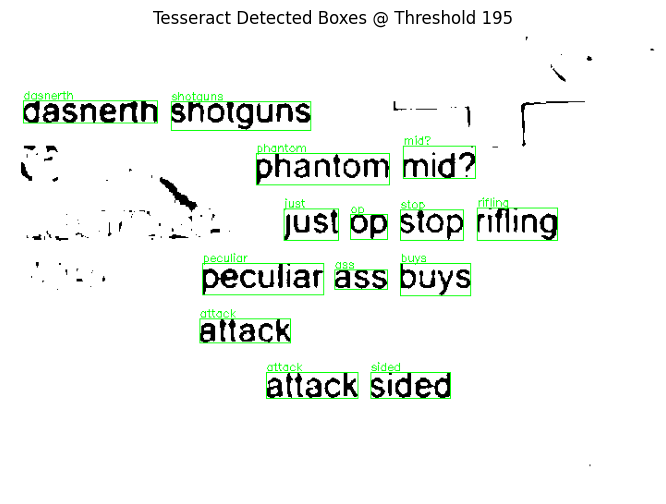

In [ ]:
img = cv2.imread("frames/frame0000.png")
chat_crop = img[800:1300, 0:700]  # adjust these
gray = cv2.cvtColor(chat_crop, cv2.COLOR_BGR2GRAY)
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
enhanced = clahe.apply(gray)
_, thresh = cv2.threshold(enhanced, 195, 255, cv2.THRESH_BINARY)
inverted = 255 - thresh
cleaned = cv2.morphologyEx(inverted, cv2.MORPH_OPEN, np.ones((2,2), np.uint8))
data = pytesseract.image_to_data(cleaned, output_type=Output.DICT)

# draw boxes on a copy of the image -- rule to avoid having the blobs count as letter is that letters are the same size, sit on axes -- (fit in a box)
img_boxes = cv2.cvtColor(cleaned, cv2.COLOR_GRAY2BGR)
for i in range(len(data['text'])):
    txt = data['text'][i].strip()
    conf = int(data['conf'][i])
    if conf < 60 or not txt:
        continue
    x, y, w, h = data['left'][i], data['top'][i], data['width'][i], data['height'][i]
    cv2.rectangle(img_boxes, (x, y), (x + w, y + h), (0, 255, 0), 1)
    cv2.putText(img_boxes, txt, (x, y - 2), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 0), 1)
plt.figure(figsize=(10, 6))
plt.imshow(cv2.cvtColor(img_boxes, cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.title("Tesseract Detected Boxes @ Threshold 195")
plt.show()


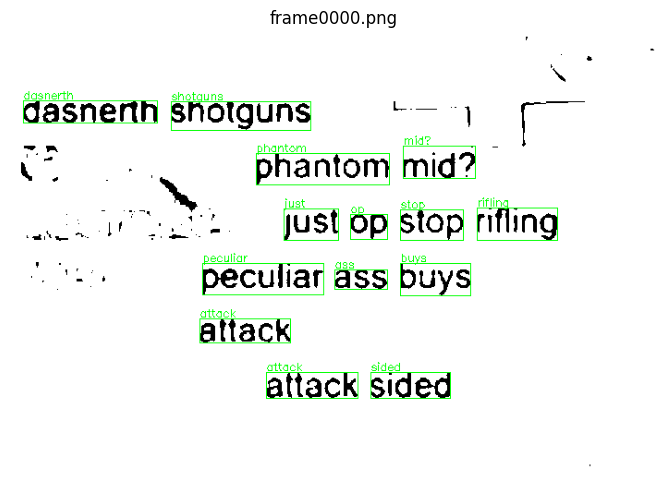

Saved boxed_frames/boxed_frame0000.png


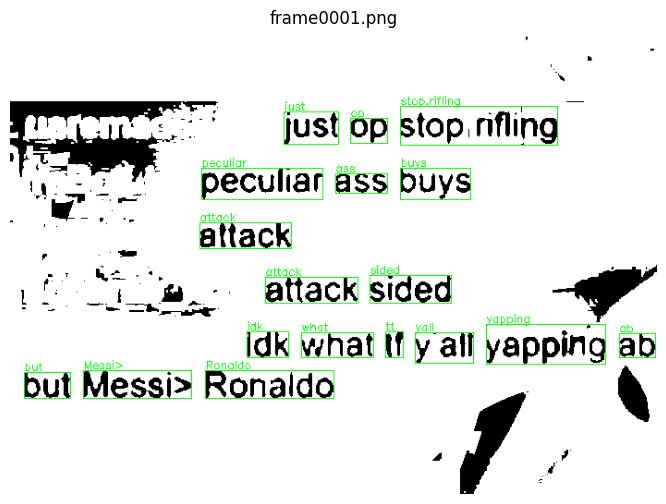

Saved boxed_frames/boxed_frame0001.png


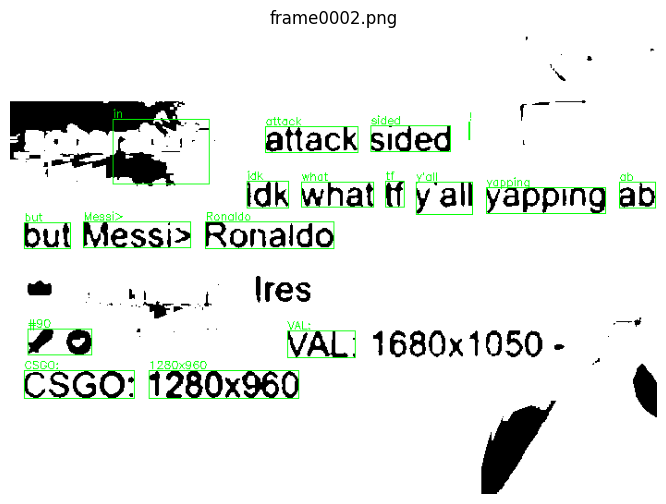

Saved boxed_frames/boxed_frame0002.png


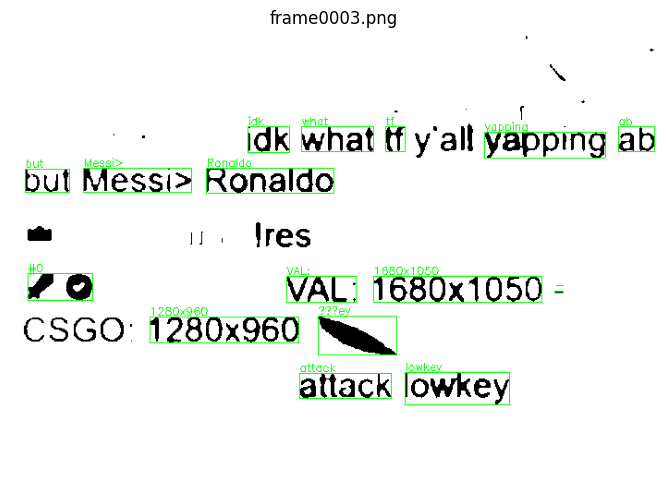

Saved boxed_frames/boxed_frame0003.png


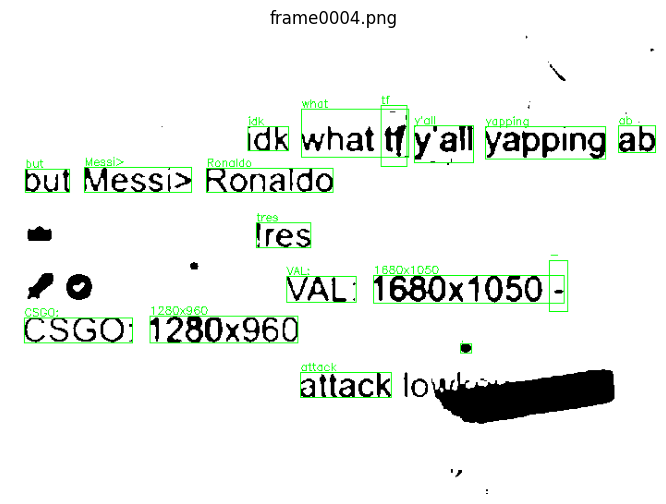

Saved boxed_frames/boxed_frame0004.png


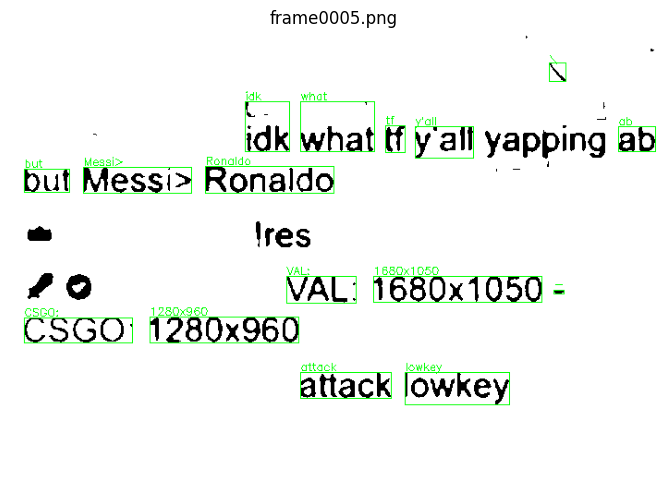

Saved boxed_frames/boxed_frame0005.png


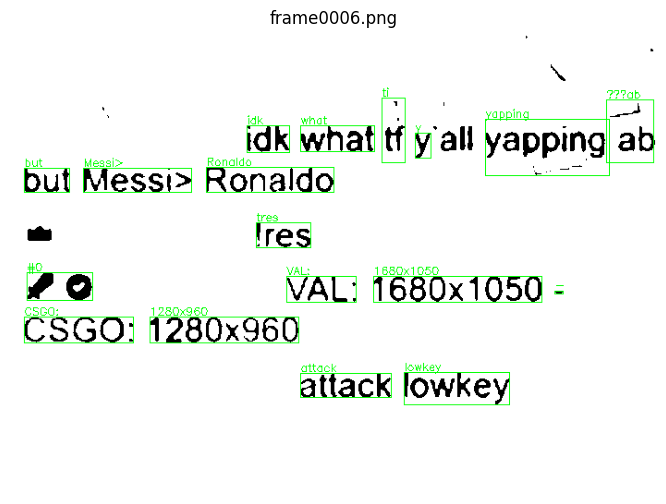

Saved boxed_frames/boxed_frame0006.png


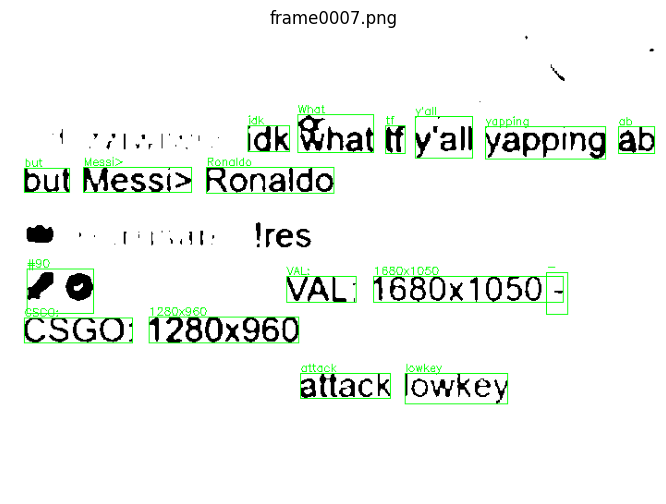

Saved boxed_frames/boxed_frame0007.png


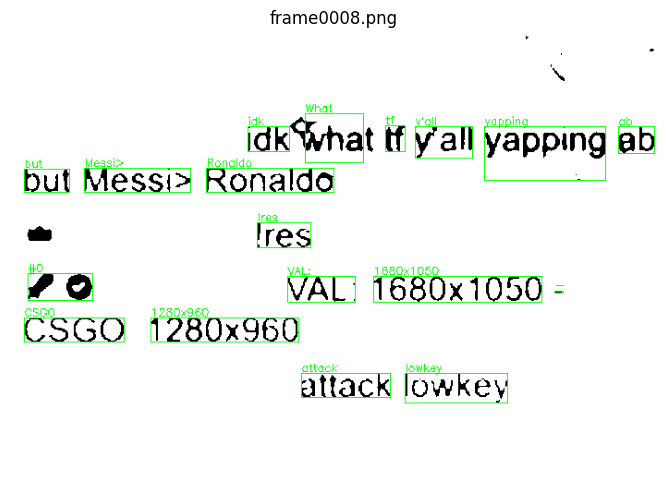

Saved boxed_frames/boxed_frame0008.png


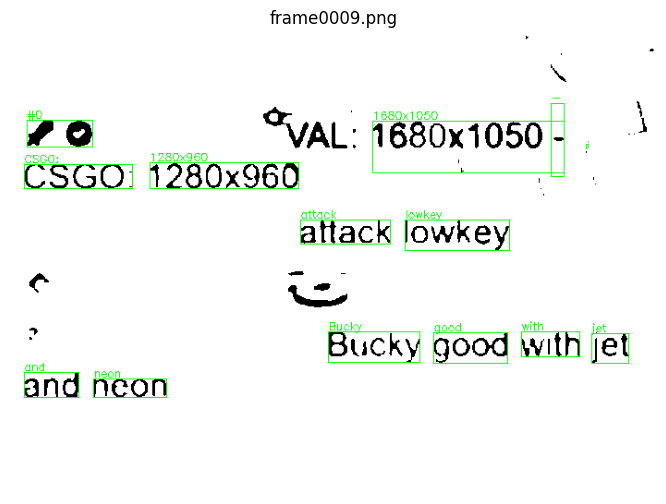

Saved boxed_frames/boxed_frame0009.png


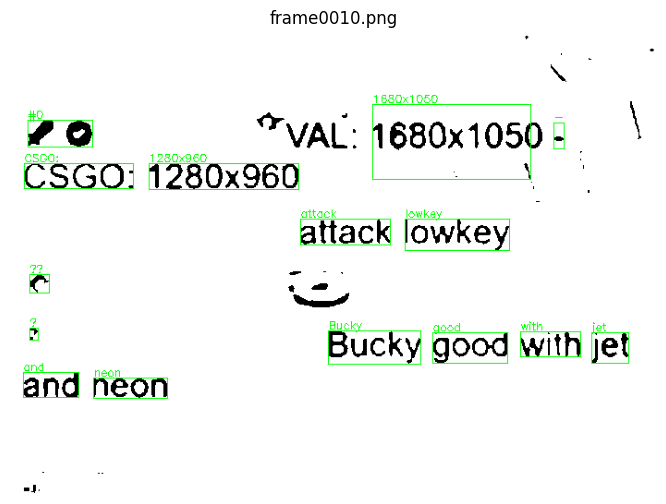

Saved boxed_frames/boxed_frame0010.png


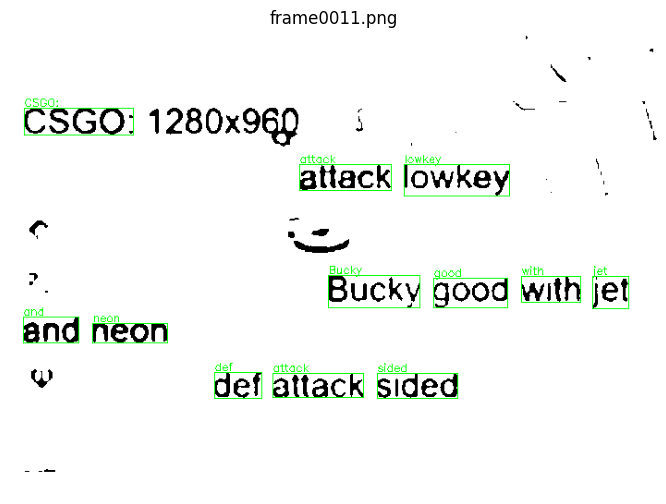

Saved boxed_frames/boxed_frame0011.png


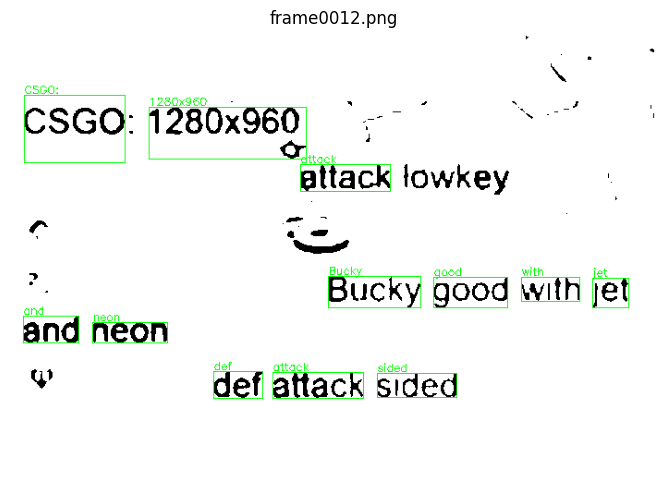

Saved boxed_frames/boxed_frame0012.png


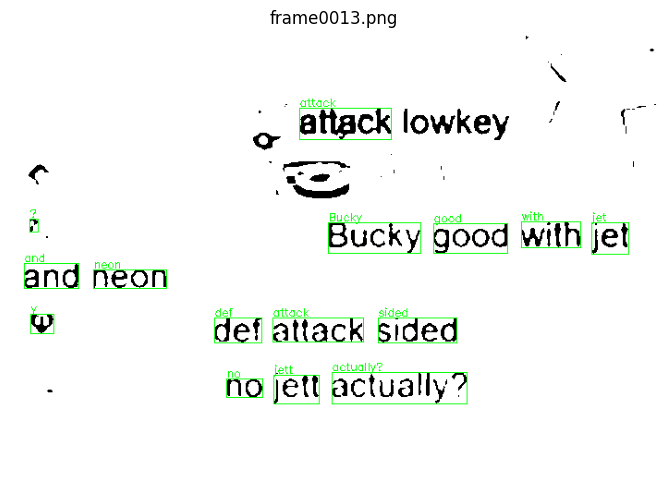

Saved boxed_frames/boxed_frame0013.png


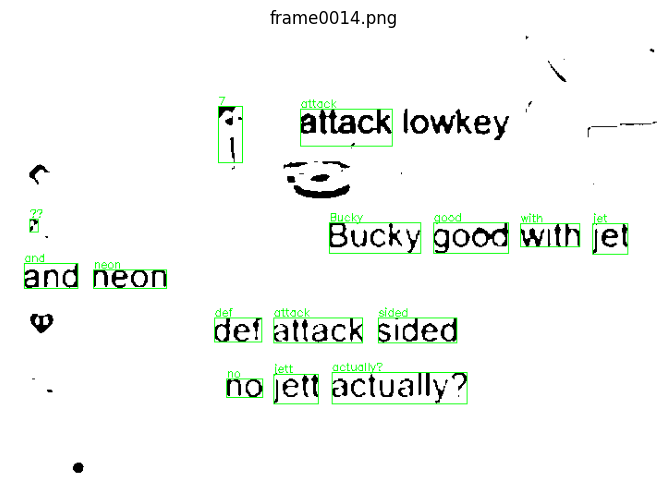

Saved boxed_frames/boxed_frame0014.png


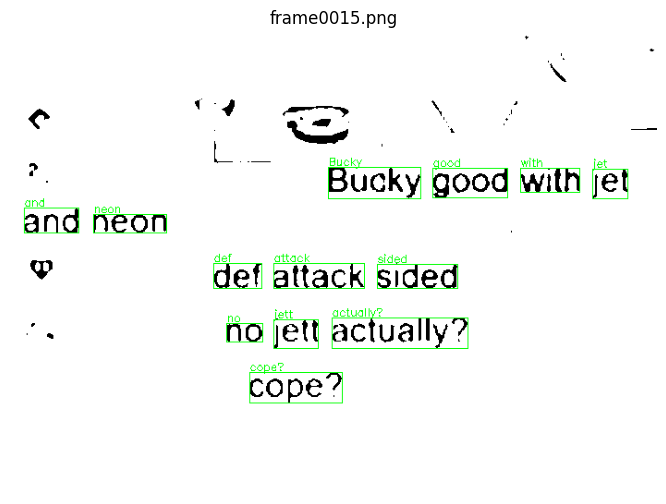

Saved boxed_frames/boxed_frame0015.png


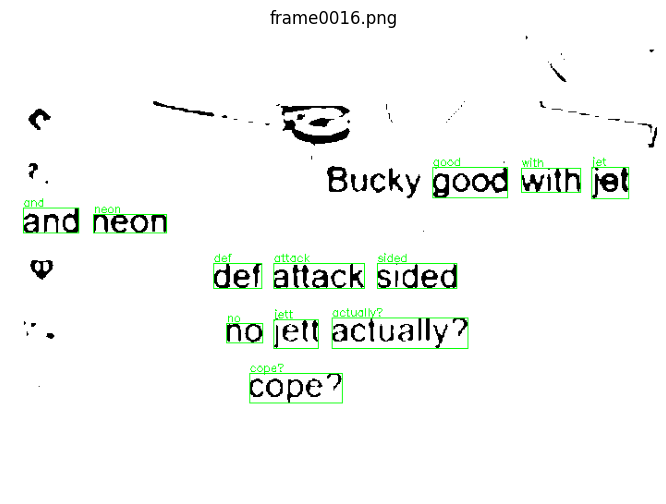

Saved boxed_frames/boxed_frame0016.png


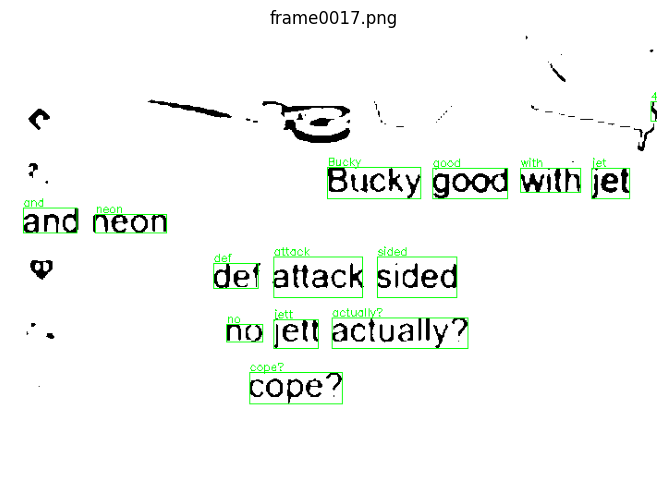

Saved boxed_frames/boxed_frame0017.png


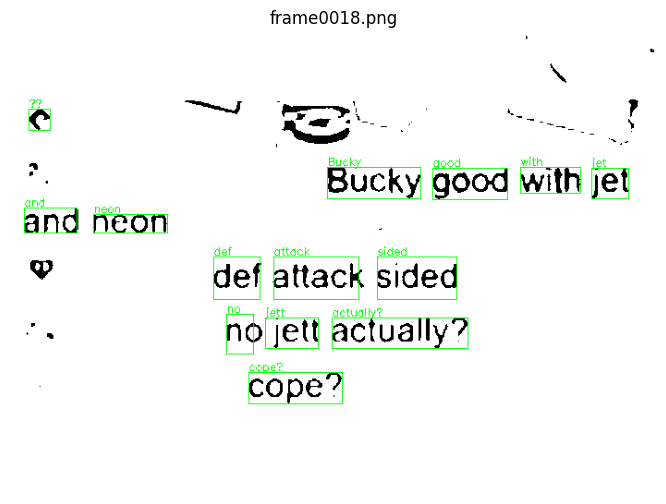

Saved boxed_frames/boxed_frame0018.png


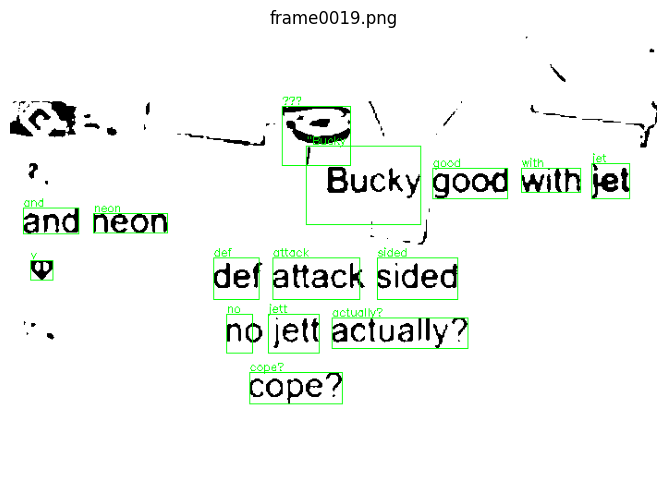

Saved boxed_frames/boxed_frame0019.png


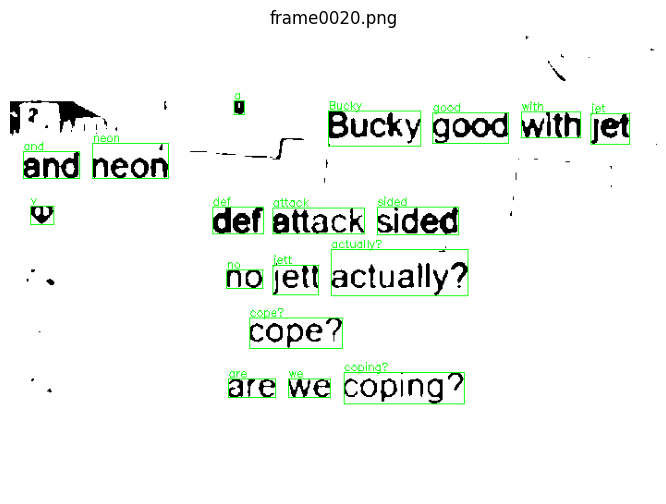

Saved boxed_frames/boxed_frame0020.png


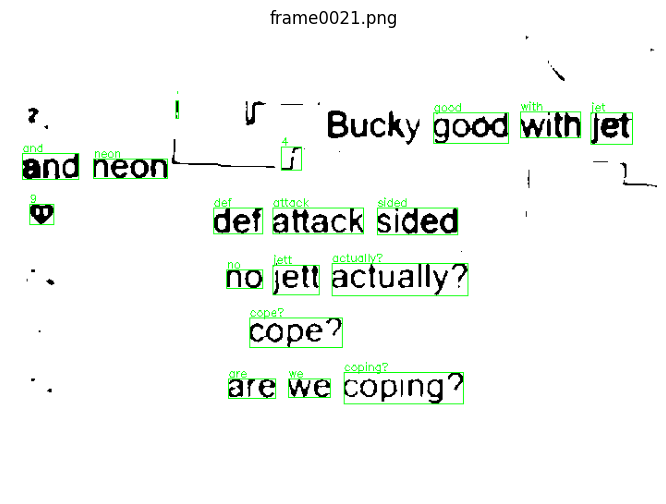

Saved boxed_frames/boxed_frame0021.png


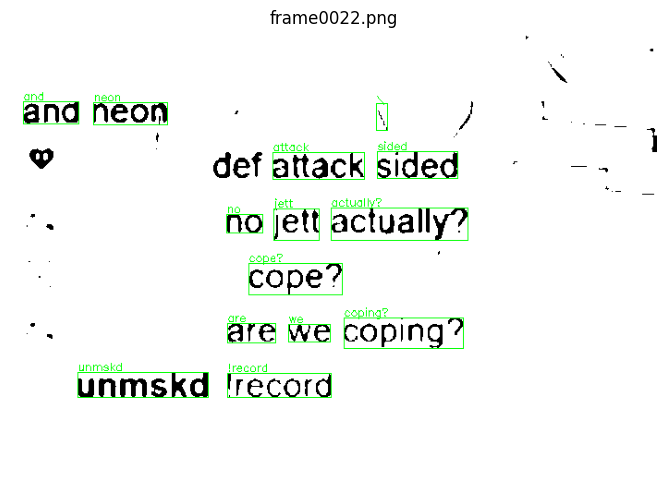

Saved boxed_frames/boxed_frame0022.png


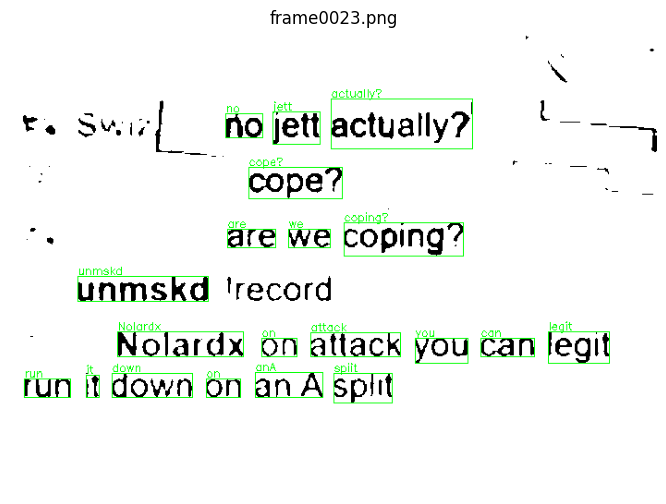

Saved boxed_frames/boxed_frame0023.png


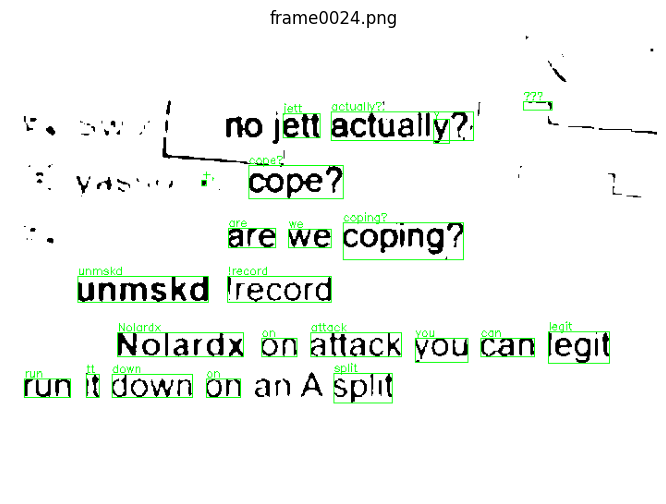

Saved boxed_frames/boxed_frame0024.png


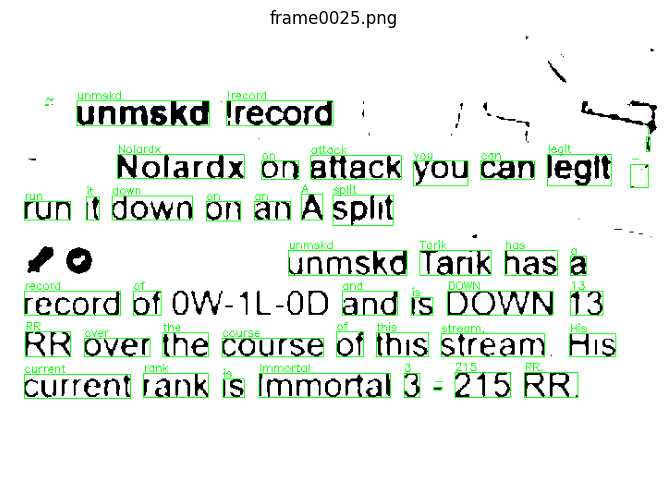

Saved boxed_frames/boxed_frame0025.png


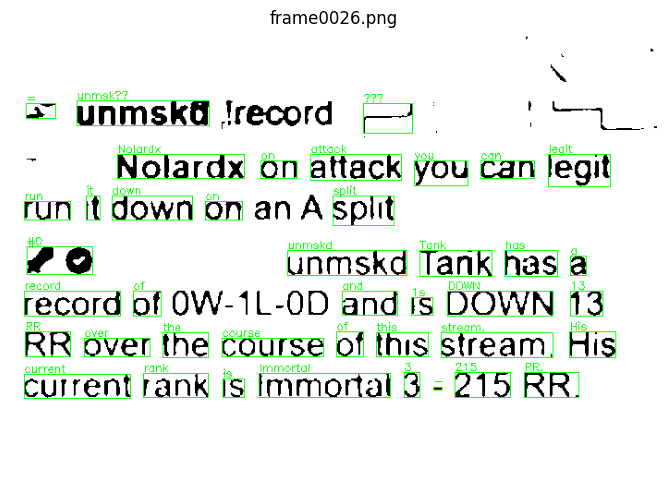

Saved boxed_frames/boxed_frame0026.png


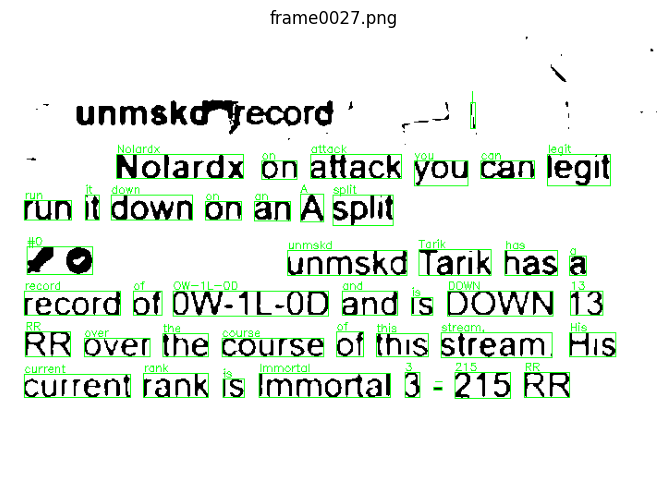

Saved boxed_frames/boxed_frame0027.png


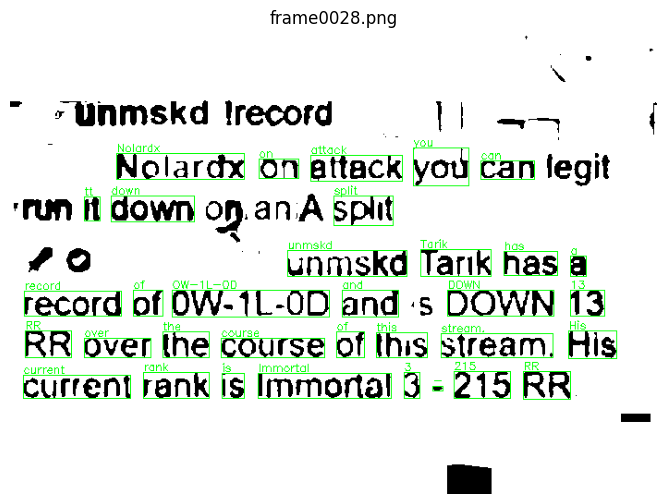

Saved boxed_frames/boxed_frame0028.png


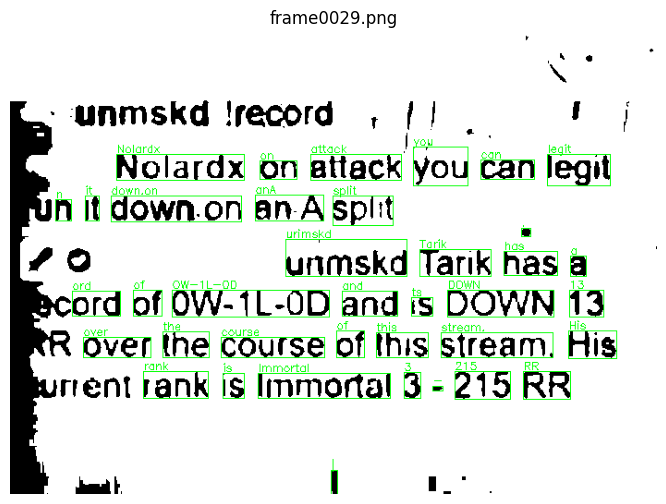

Saved boxed_frames/boxed_frame0029.png


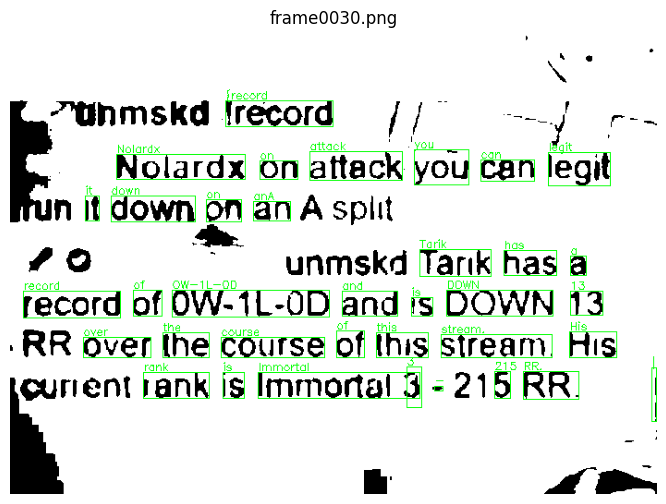

Saved boxed_frames/boxed_frame0030.png


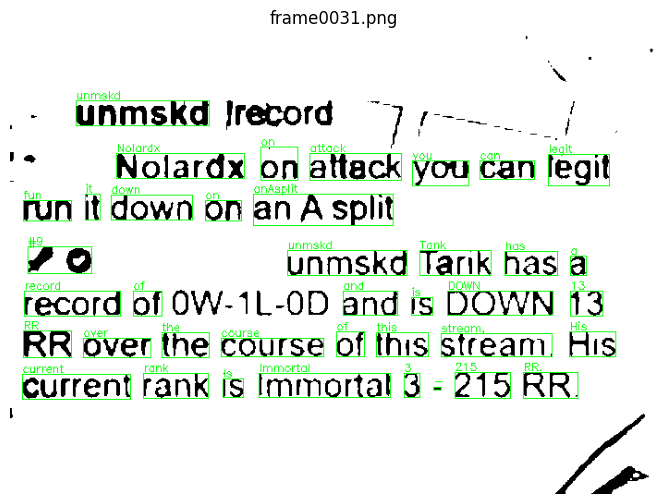

Saved boxed_frames/boxed_frame0031.png


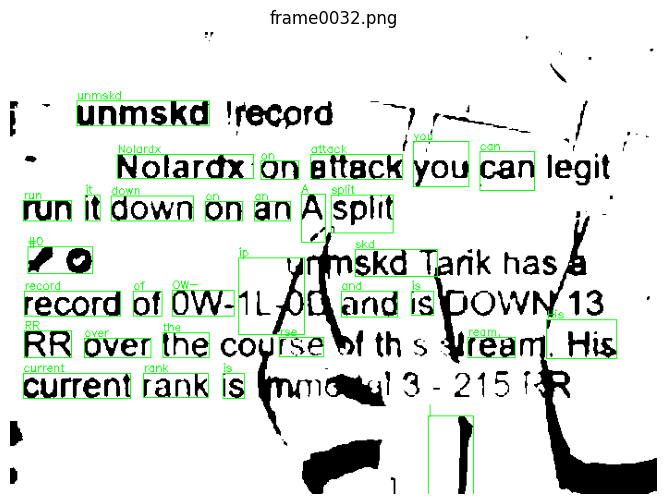

Saved boxed_frames/boxed_frame0032.png


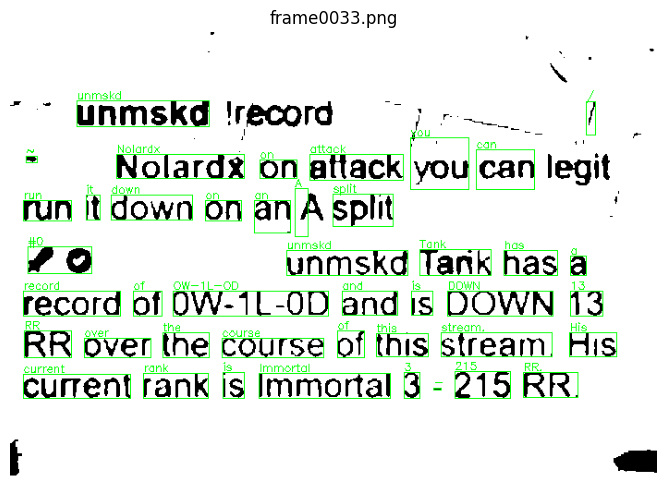

Saved boxed_frames/boxed_frame0033.png


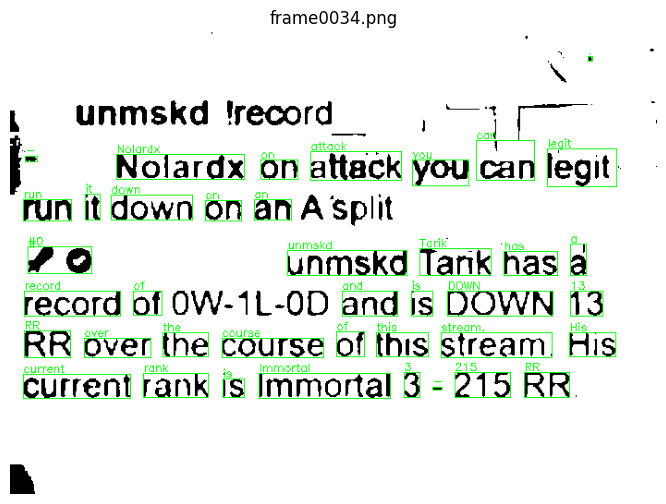

Saved boxed_frames/boxed_frame0034.png


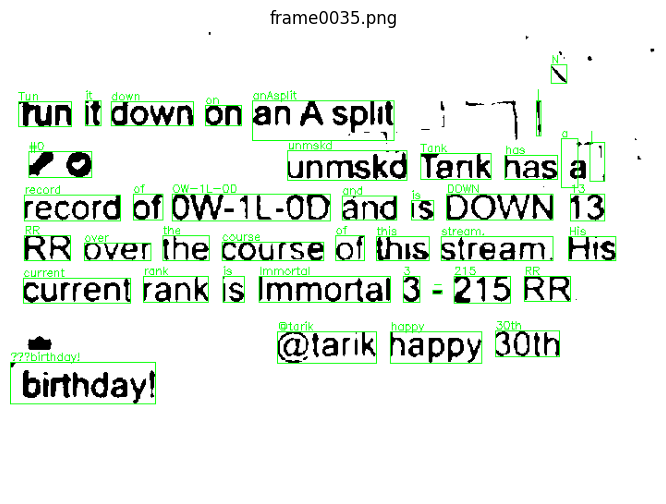

Saved boxed_frames/boxed_frame0035.png


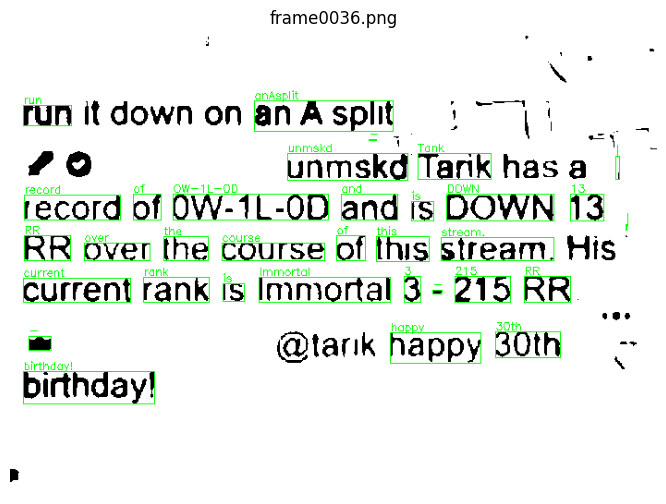

Saved boxed_frames/boxed_frame0036.png


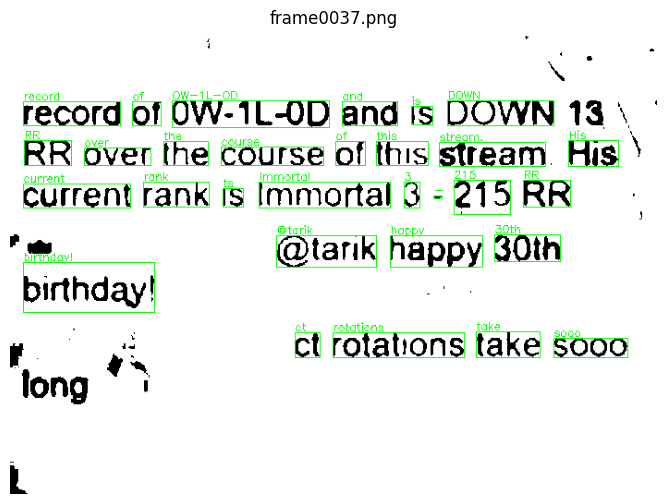

Saved boxed_frames/boxed_frame0037.png


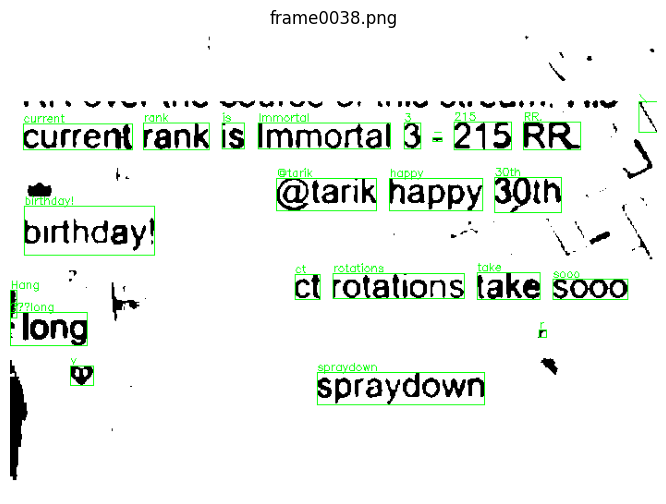

Saved boxed_frames/boxed_frame0038.png


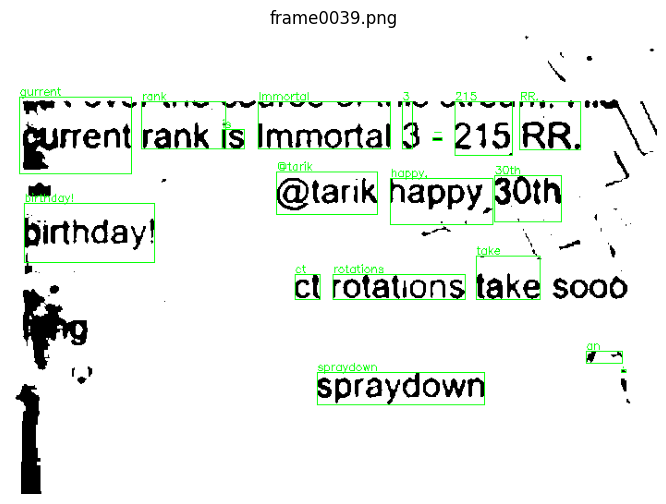

Saved boxed_frames/boxed_frame0039.png


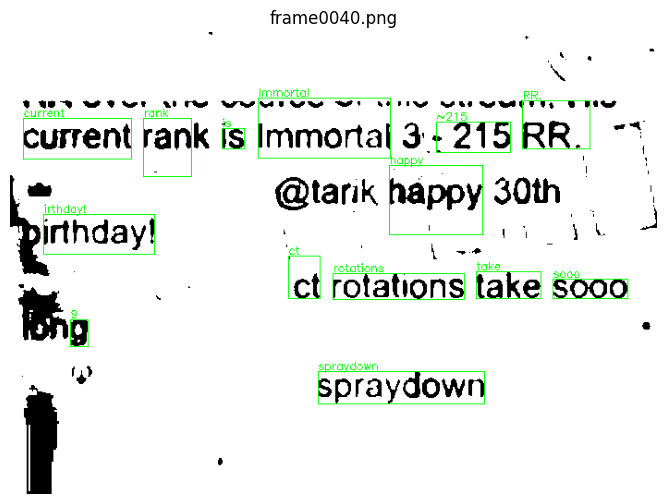

Saved boxed_frames/boxed_frame0040.png


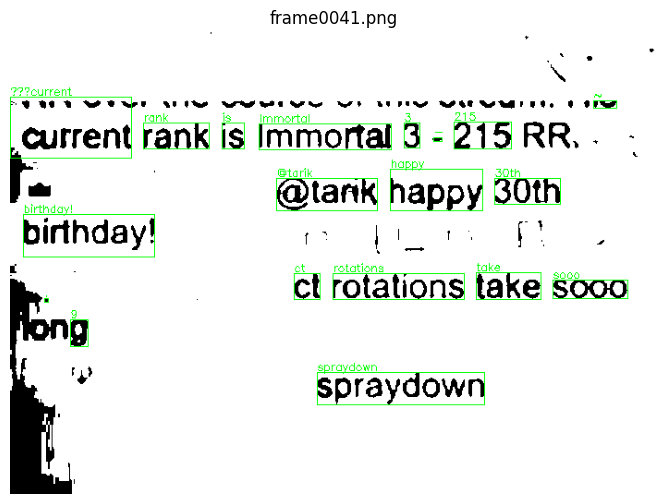

Saved boxed_frames/boxed_frame0041.png


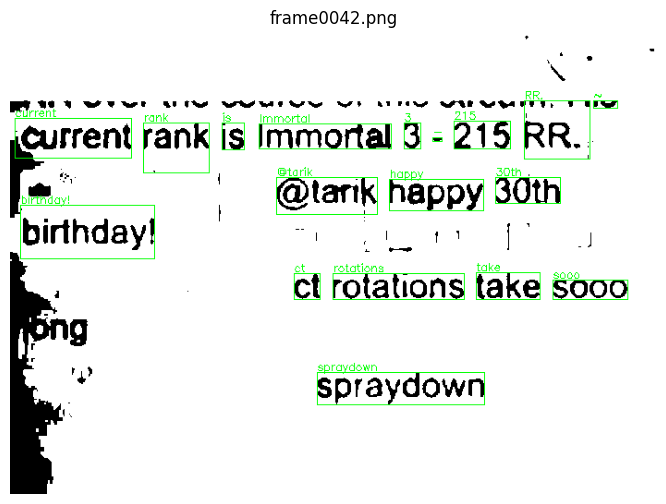

Saved boxed_frames/boxed_frame0042.png


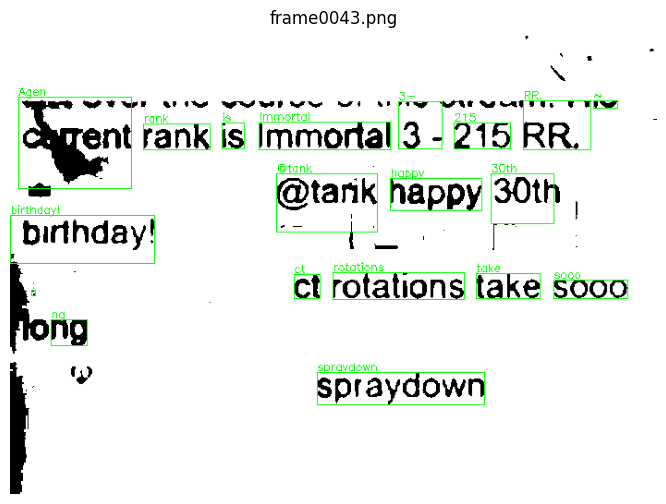

Saved boxed_frames/boxed_frame0043.png


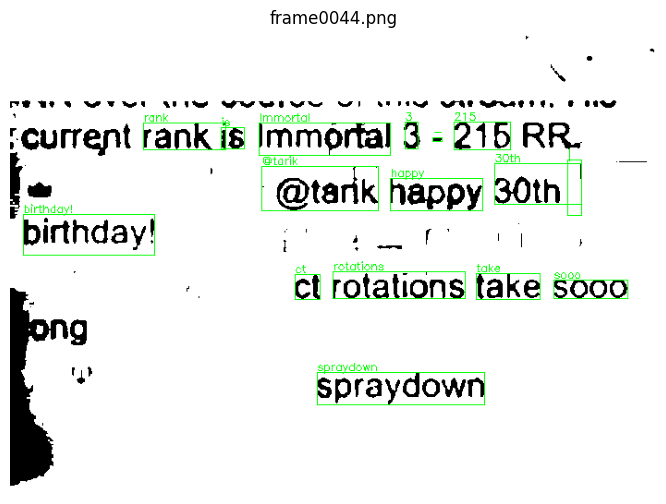

Saved boxed_frames/boxed_frame0044.png


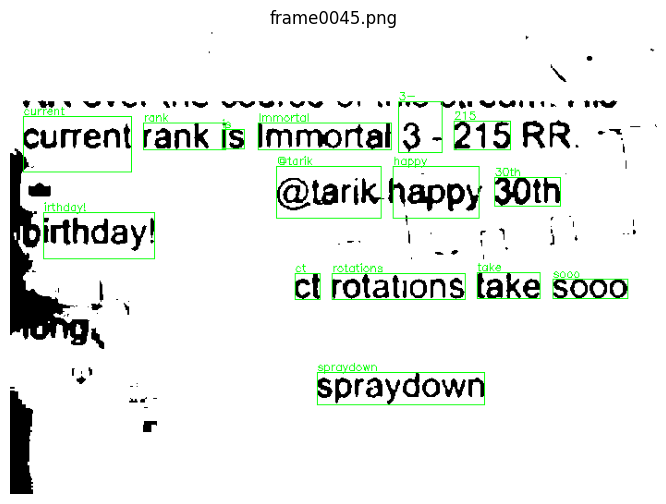

Saved boxed_frames/boxed_frame0045.png


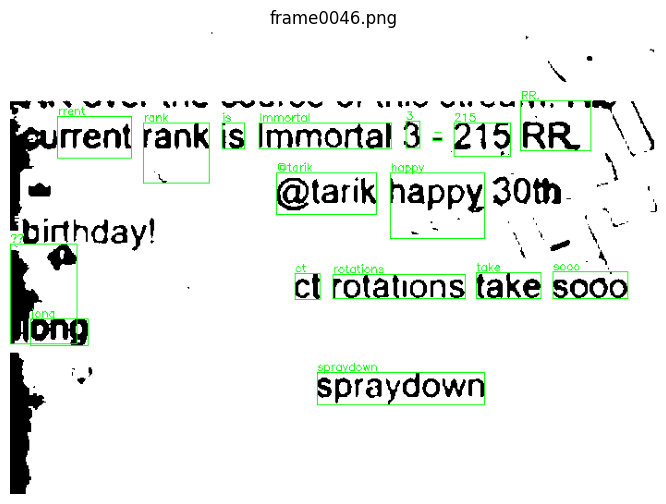

Saved boxed_frames/boxed_frame0046.png


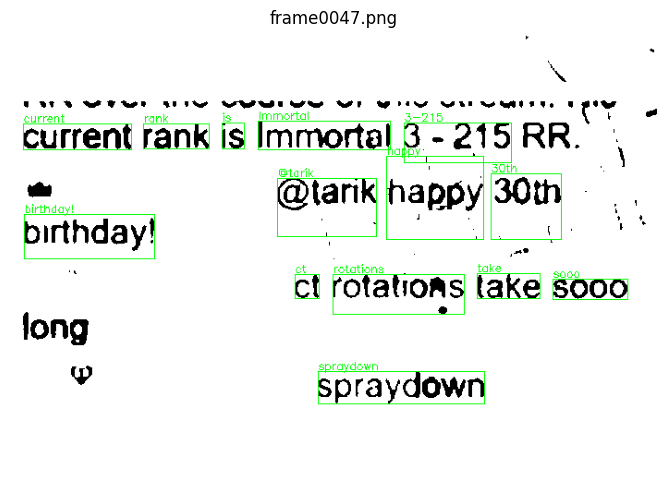

Saved boxed_frames/boxed_frame0047.png


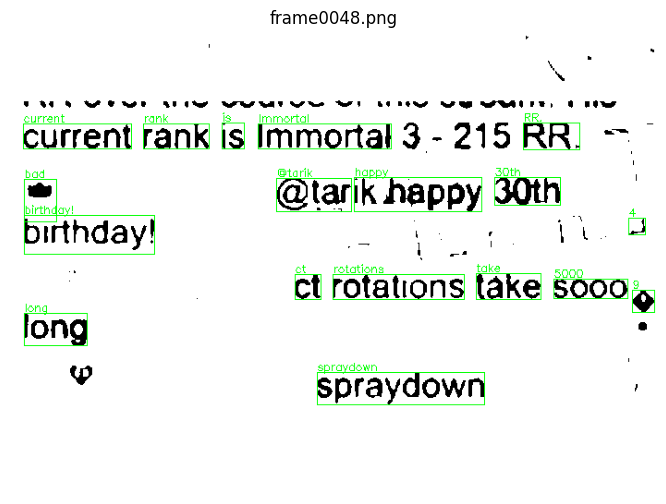

Saved boxed_frames/boxed_frame0048.png


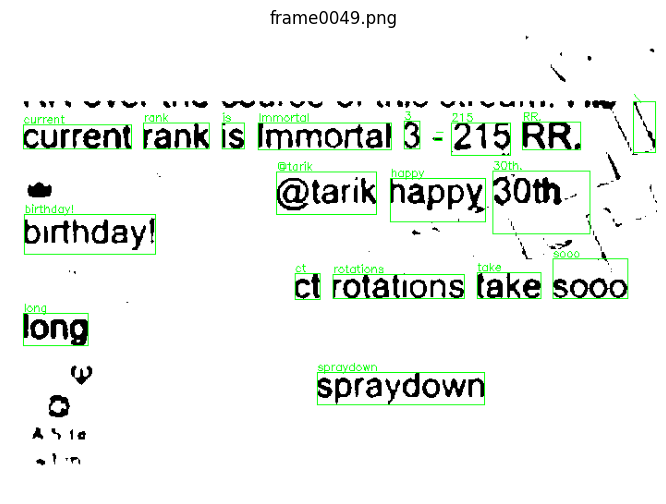

Saved boxed_frames/boxed_frame0049.png


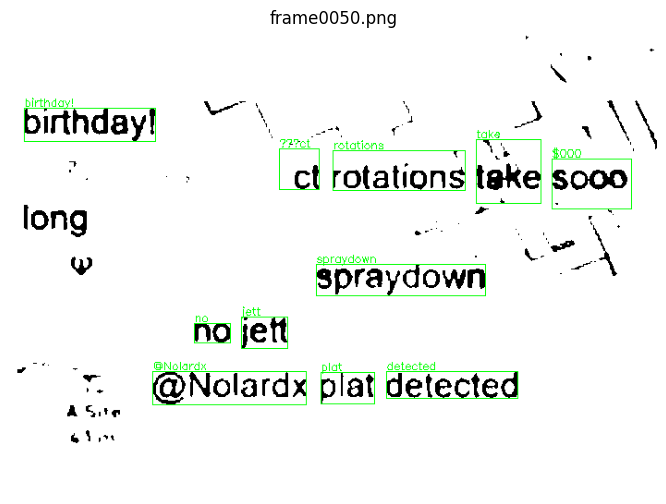

Saved boxed_frames/boxed_frame0050.png


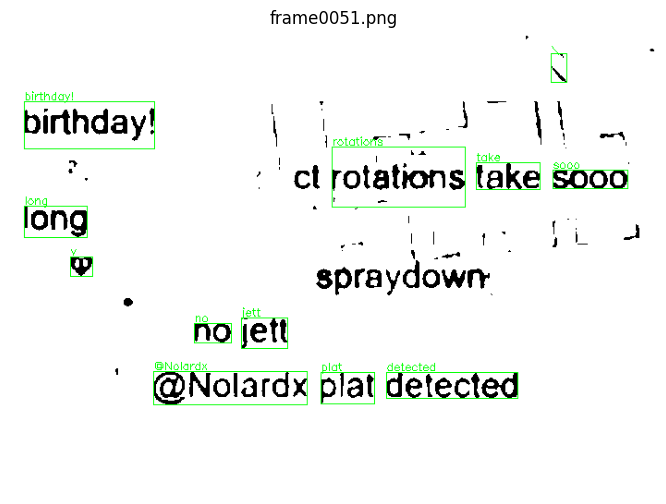

Saved boxed_frames/boxed_frame0051.png


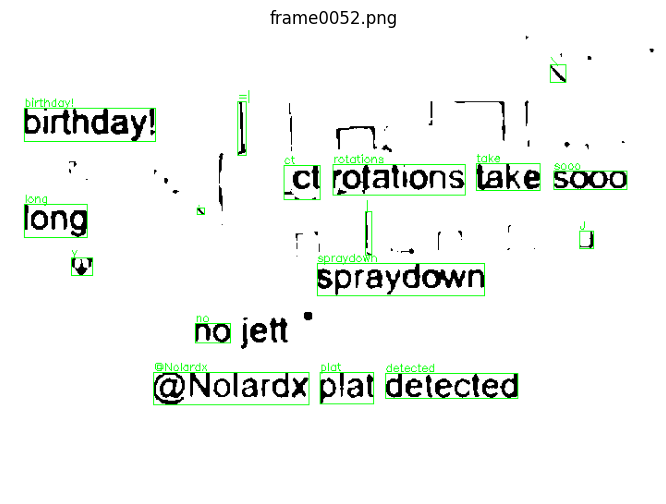

Saved boxed_frames/boxed_frame0052.png


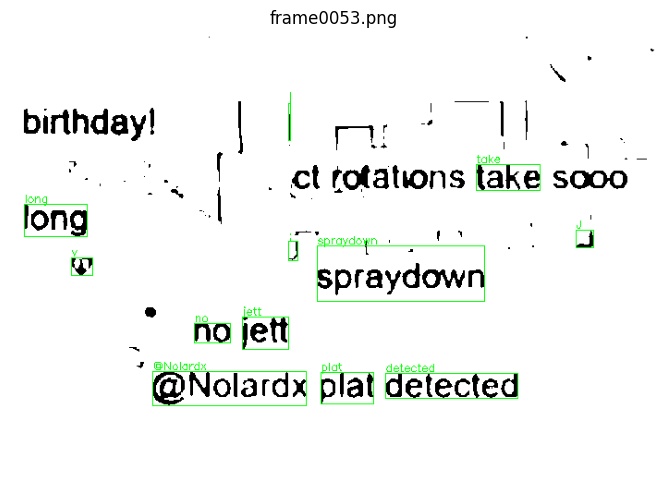

Saved boxed_frames/boxed_frame0053.png


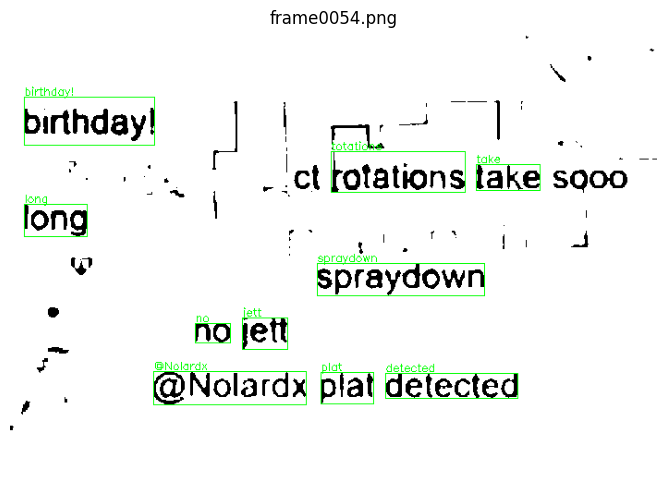

Saved boxed_frames/boxed_frame0054.png


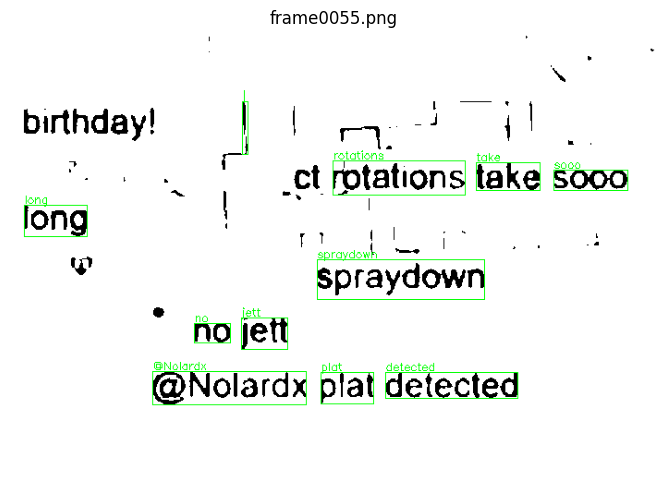

Saved boxed_frames/boxed_frame0055.png


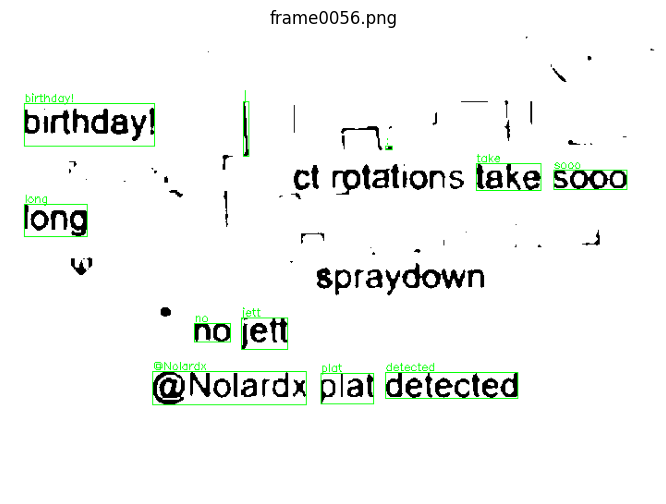

Saved boxed_frames/boxed_frame0056.png


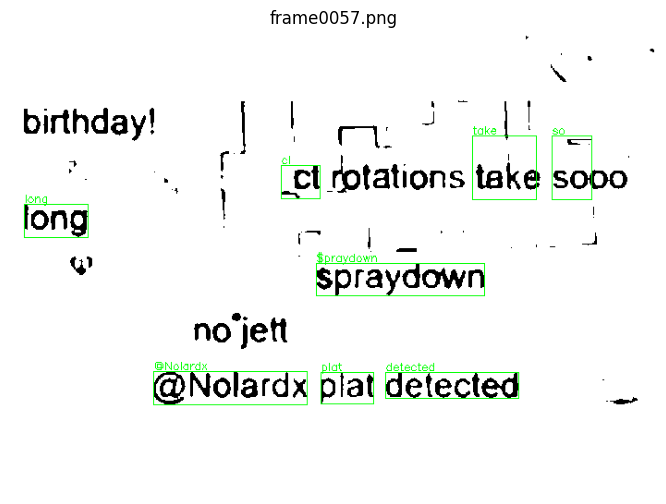

Saved boxed_frames/boxed_frame0057.png


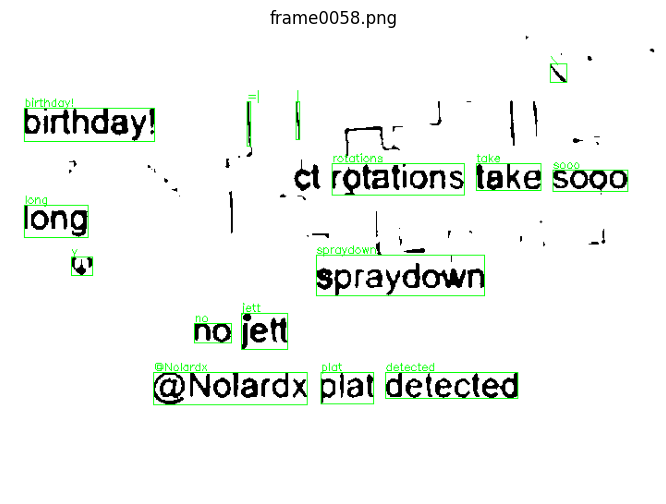

Saved boxed_frames/boxed_frame0058.png


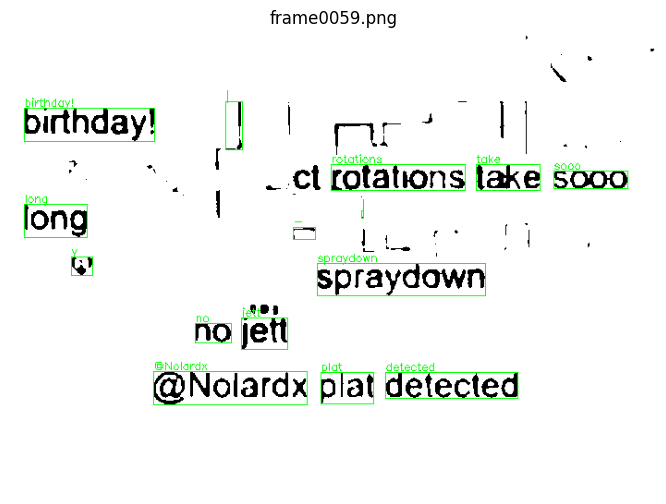

Saved boxed_frames/boxed_frame0059.png


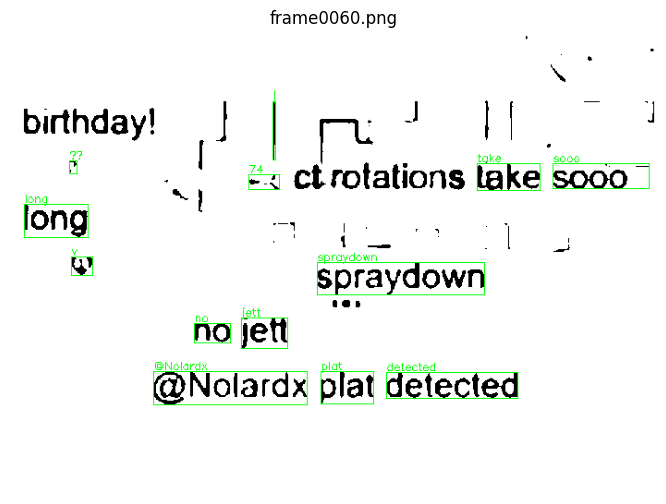

Saved boxed_frames/boxed_frame0060.png


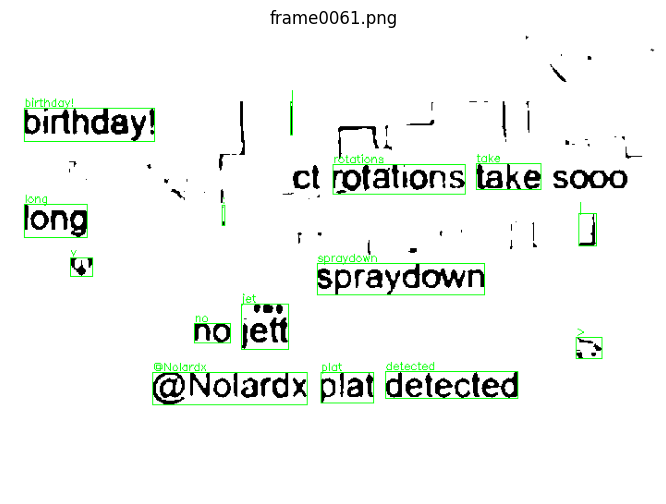

Saved boxed_frames/boxed_frame0061.png


In [ ]:
# full run through on the full frame folder

os.makedirs("boxed_frames", exist_ok=True)
threshold_value = 195
conf_thresh = 60
for fname in sorted(os.listdir("frames")):
    if not fname.endswith(".png"):
        continue
    frame_path = os.path.join("frames", fname)
    img = cv2.imread(frame_path)
    chat_crop = img[800:1300, 0:700]  # adjust this if needed
    gray = cv2.cvtColor(chat_crop, cv2.COLOR_BGR2GRAY)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    enhanced = clahe.apply(gray)
    _, thresh = cv2.threshold(enhanced, threshold_value, 255, cv2.THRESH_BINARY)
    inverted = 255 - thresh
    cleaned = cv2.morphologyEx(inverted, cv2.MORPH_OPEN, np.ones((2,2), np.uint8))
    data = pytesseract.image_to_data(cleaned, output_type=Output.DICT)
    img_boxes = cv2.cvtColor(cleaned, cv2.COLOR_GRAY2BGR)
    for i in range(len(data['text'])):
        txt = data['text'][i].strip()
        conf = int(data['conf'][i])
        if conf < conf_thresh or not txt:
            continue
        x, y, w, h = data['left'][i], data['top'][i], data['width'][i], data['height'][i]
        cv2.rectangle(img_boxes, (x, y), (x + w, y + h), (0, 255, 0), 1)
        cv2.putText(img_boxes, txt, (x, y - 2), cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 0), 1)
    out_path = os.path.join("boxed_frames", f"boxed_{fname}")
    plt.figure(figsize=(10, 6))
    plt.imshow(cv2.cvtColor(img_boxes, cv2.COLOR_BGR2RGB))
    plt.axis('off')
    plt.title(fname)
    plt.show()
    print(f"yippee done with {out_path}")
